**Author**: Jayanth Damodaran  
Place any questions about the contents of the notebook in the issues section

# Introduction

In this notebook, we will go over common signal processing techniques that are essential for not just for motor imagery classification tasks, but are employed when working on tasks dealing with virtually any sort of digital signal.

Contents include filtering, segmentation, normalization, frequency, and time-frequency analysis

**Steps to use notebook**  
1. Download .ipynb file
2. Open google colab in your browser and click open notebook
  - or if you are taken to an untitled notebook, click file in top left, then upload notebook
3. Run each cell sequentially, and upload npy file when prompted in below cell
  - if file upload doesn't work, try clicking the folder icon in left tab section, then click the file upload symbol to upload file from computer
  - alternatively, upload npy file to google drive, then click the folder icon in left tab section. Then, click the google drive symbol which should add a code cell that you run. Your google drive should then be attached to this environment, and you should be able to access the npy file

In [5]:
import scipy
import matplotlib.pyplot as plt
import numpy as np

The data used is from the BCI Competition IV 2a dataset, which includes 22 EEG channels sampled at 250Hz. For this tutorial, a numpy file containing the first 6s of the first patient's right hand session is used.

In [6]:
from google.colab import files
uploaded = files.upload()

Saving BCI_IV_2a_EEGclip.npy to BCI_IV_2a_EEGclip (1).npy


In [7]:
sig = np.load('/content/BCI_IV_2a_EEGclip.npy')

In [4]:
sig.shape # [channels, time steps], time steps = sampling_freq * time

(22, 1500)

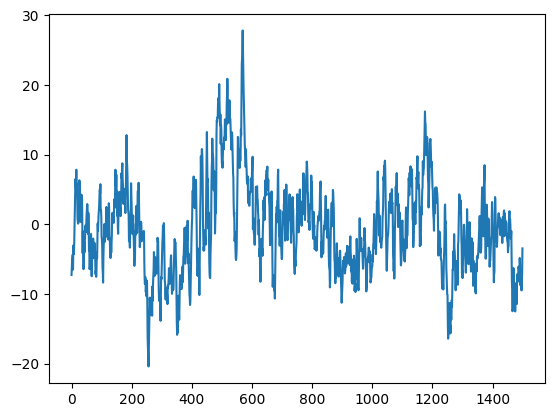

In [5]:
plt.plot(sig[0,:]) # plot first channel of eeg signal

# Low and High pass filter

Scipy docs: https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.butter.html

In [6]:
# low pass filter attenuates frequencies above a critical value (upper_bound)
order = 4
upper_bound = 40
sampling_freq = 250

b, a = scipy.signal.butter(order, upper_bound, btype = 'low', fs = sampling_freq)
processed_signal = scipy.signal.filtfilt(b, a, sig, 1)

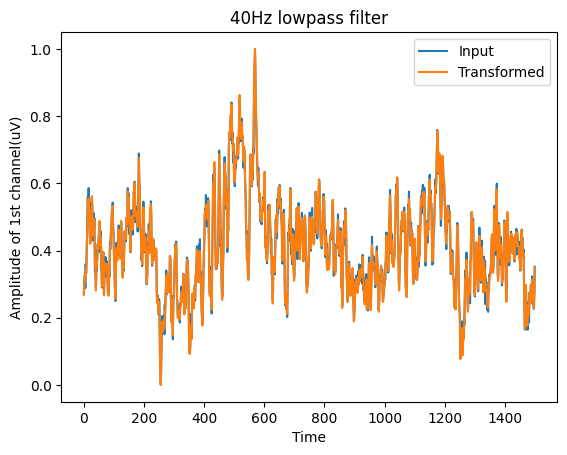

In [7]:
# must normalize to visualize both original and filtered signal on same plot
plt.figure()
plt.xlabel('Time')
plt.ylabel('Amplitude of 1st channel(uV)')
plt.title('40Hz lowpass filter')

# get array filled with minimum and maximum in each channel
signal_min = np.full((sig.shape[1], sig.shape[0]), np.min(sig, 1)).transpose()
signal_max = np.full((sig.shape[1], sig.shape[0]), np.max(sig, 1)).transpose()

# min-max normalization of original signal
normed_signal = (sig - signal_min) / (signal_max - signal_min)

# minmax normalization of filtered signal
filtered_min = np.full((processed_signal.shape[1], processed_signal.shape[0]), np.min(processed_signal, 1)).transpose()
filtered_max = np.full((processed_signal.shape[1], processed_signal.shape[0]), np.max(processed_signal, 1)).transpose()
normed_filt = (processed_signal - filtered_min) / (filtered_max - filtered_min)

# plot first channel of both signals
plt.plot(np.arange(normed_signal[0].size), normed_signal[0], label = 'Input')
plt.plot(np.arange(normed_filt[0].size), normed_filt[0], label = 'Transformed')
plt.legend()

In [8]:
# high pass filter attenuates frequencies below a critical value (lower_bound)
order = 4
lower_bound = 5
sampling_freq = 250

b, a = scipy.signal.butter(order, lower_bound, btype = 'high', fs = sampling_freq)
processed_signal = scipy.signal.filtfilt(b, a, sig, 1)

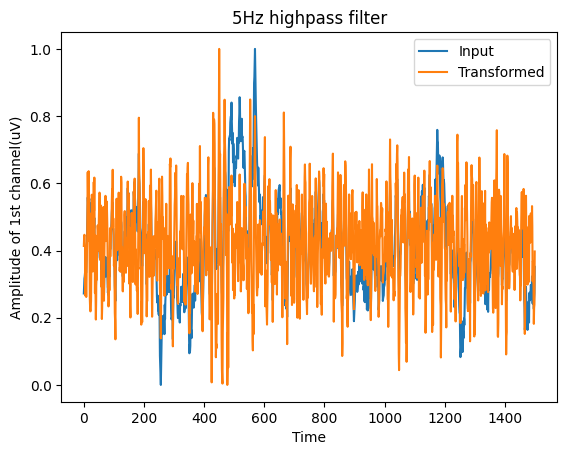

In [9]:
# must normalize to visualize both original and filtered signal on same plot
plt.figure()
plt.xlabel('Time')
plt.ylabel('Amplitude of 1st channel(uV)')
plt.title('5Hz highpass filter')

# get array filled with minimum and maximum in each channel
signal_min = np.full((sig.shape[1], sig.shape[0]), np.min(sig, 1)).transpose()
signal_max = np.full((sig.shape[1], sig.shape[0]), np.max(sig, 1)).transpose()

# min-max normalization of original signal
normed_signal = (sig - signal_min) / (signal_max - signal_min)

# minmax normalization of filtered signal
filtered_min = np.full((processed_signal.shape[1], processed_signal.shape[0]), np.min(processed_signal, 1)).transpose()
filtered_max = np.full((processed_signal.shape[1], processed_signal.shape[0]), np.max(processed_signal, 1)).transpose()
normed_filt = (processed_signal - filtered_min) / (filtered_max - filtered_min)

# plot first channel of both signals
plt.plot(np.arange(normed_signal[0].size), normed_signal[0], label = 'Input')
plt.plot(np.arange(normed_filt[0].size), normed_filt[0], label = 'Transformed')
plt.legend()

# Bandpass filtering

In [10]:
# bandpass filters attenuate frequencies outside of a band (crit_freq)
order = 4
crit_freq = [5, 40]
sampling_freq = 250

b, a = scipy.signal.butter(order, crit_freq, btype = 'bandpass', fs = sampling_freq)
processed_signal = scipy.signal.filtfilt(b, a, sig, 1)

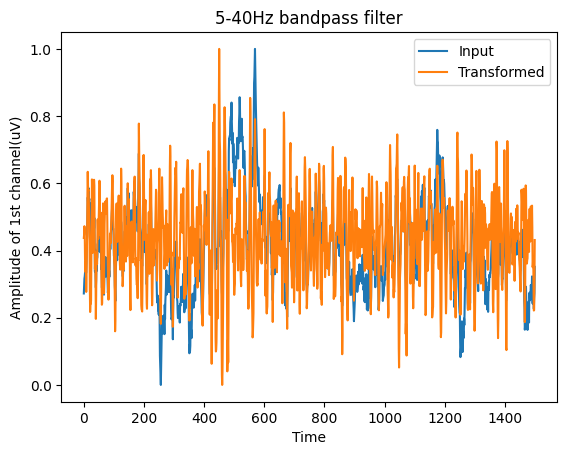

In [11]:
# must normalize to visualize both original and filtered signal on same plot
plt.figure()
plt.xlabel('Time')
plt.ylabel('Amplitude of 1st channel(uV)')
plt.title('5-40Hz bandpass filter')

# get array filled with minimum and maximum in each channel
signal_min = np.full((sig.shape[1], sig.shape[0]), np.min(sig, 1)).transpose()
signal_max = np.full((sig.shape[1], sig.shape[0]), np.max(sig, 1)).transpose()

# min-max normalization of original signal
normed_signal = (sig - signal_min) / (signal_max - signal_min)

# minmax normalization of filtered signal
filtered_min = np.full((processed_signal.shape[1], processed_signal.shape[0]), np.min(processed_signal, 1)).transpose()
filtered_max = np.full((processed_signal.shape[1], processed_signal.shape[0]), np.max(processed_signal, 1)).transpose()
normed_filt = (processed_signal - filtered_min) / (filtered_max - filtered_min)

# plot first channel of both signals
plt.plot(np.arange(normed_signal[0].size), normed_signal[0], label = 'Input')
plt.plot(np.arange(normed_filt[0].size), normed_filt[0], label = 'Transformed')
plt.legend()

# Notch/bandstop filter

In [12]:
# bandstop filters attenuate frequencies within a band (crit_freq)
order = 4
crit_freq = [5, 40]
sampling_freq = 250

b, a = scipy.signal.butter(order, crit_freq, btype = 'bandstop', fs = sampling_freq)
processed_signal = scipy.signal.filtfilt(b, a, sig, 1)

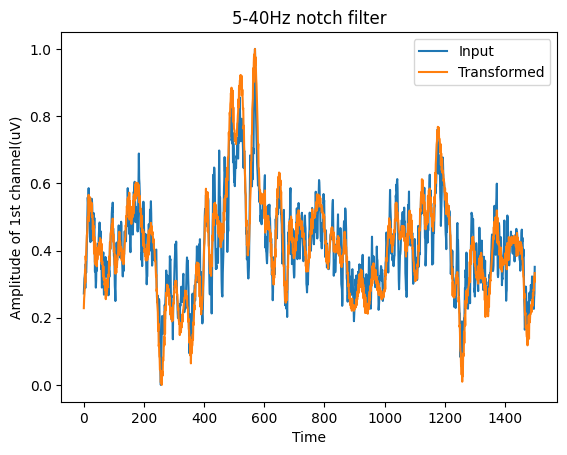

In [13]:
# must normalize to visualize both original and filtered signal on same plot
plt.figure()
plt.xlabel('Time')
plt.ylabel('Amplitude of 1st channel(uV)')
plt.title('5-40Hz notch filter')

# get array filled with minimum and maximum in each channel
signal_min = np.full((sig.shape[1], sig.shape[0]), np.min(sig, 1)).transpose()
signal_max = np.full((sig.shape[1], sig.shape[0]), np.max(sig, 1)).transpose()

# min-max normalization of original signal
normed_signal = (sig - signal_min) / (signal_max - signal_min)

# minmax normalization of filtered signal
filtered_min = np.full((processed_signal.shape[1], processed_signal.shape[0]), np.min(processed_signal, 1)).transpose()
filtered_max = np.full((processed_signal.shape[1], processed_signal.shape[0]), np.max(processed_signal, 1)).transpose()
normed_filt = (processed_signal - filtered_min) / (filtered_max - filtered_min)

# plot first channel of both signals
plt.plot(np.arange(normed_signal[0].size), normed_signal[0], label = 'Input')
plt.plot(np.arange(normed_filt[0].size), normed_filt[0], label = 'Transformed')
plt.legend()

# Signal segmentation/cropping

segmentation involves a window sliding technique that takes slices of the signal at a fixed window size with a fixed window shift

In [6]:
# sometimes it is useful to partition eeg signals into smaller equal length segments
# this can combat overfitting and ensure consistency in input shape

# segment eeg data based on sampling freq(Hz), window_size(s), and window_shift(s)
window_size=1
window_shift=0.0175
sampling_freq = 250

w_size = int(sampling_freq * window_size)
w_shift = int(sampling_freq * window_shift)
segments = []
i = 0
while i + w_size <= sig.shape[1]:
  segments.append(sig[:, i: i + w_size])
  i += w_shift

In [7]:
print(len(segments))
print(segments[0].shape) # all segments of shape (22, 250)

313
(22, 250)


**Further Practice**
- convert the filters into functions that can be applied along any specified channel and signal
- implement other normalization techniques like standard and robust scaling
  - implement them on entire signal as opposed to a single channel
- use scipy.signal.iirnotch and scipy.signal.iirpeak to investigate high quality notch and bandpass filters that work on narrow frequency bands
- visualize the output of the filters in the frequency domain using scipy.fft package
  -  **Note: Nyquist Theorem states highest frequency that can be captured accurately is 1/2 sampling frequency of digital device (250Hz in this case)**

# Fast fourier transform

So far, we have mentioned filtering techniques that allow or suppress certain frequencies, but we have only ever visualized our signals in the time domain. There is a lot of meaningful information about signals that can only be uncovered by frequency or time-frequency domain analysis

**What is a Fourier Transform?**

The continuous Fourier transform is an integral transform that converts a time domain signal to a frequency domain signal. This is predicated on the idea that signals can be represented as an infinite sum of sines and cosines with different amplitude and frequency characteristics. In our applications, we typically don't have a continuous function, but instead have sampled data points. In this case, we perform a discrete fourier transform, and Fast Fourier Transform (FFT) is an algorithm that computes this efficiently.

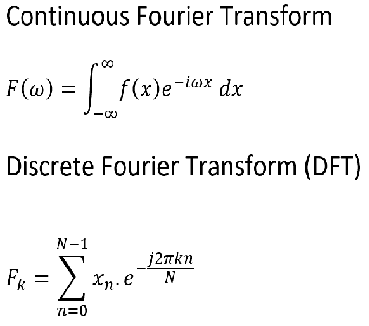

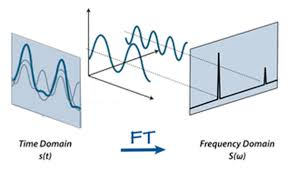

We will be using scipy's fft module
https://docs.scipy.org/doc/scipy/tutorial/fft.html

## Basic sum of sines

(-2.0, 2.0)

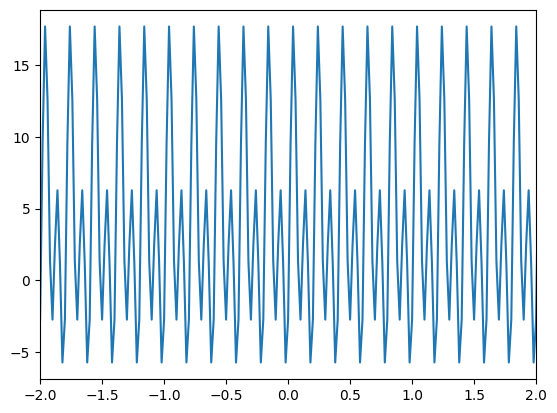

In [16]:
x = np.linspace(-10, 10, 1001)[1:] # interval (-10, 10] with 1000 datapoints
y = 6 * np.sin(10 * np.pi * x) + 8 * np.sin(20 * np.pi * x - 1) + 4 # sum of sines at 5Hz and 10Hz + vertical shift of 4
plt.plot(x, y);
plt.xlim([-2, 2])

scipy.fft.rfft() returns complex amplitudes for each frequency, NOT angular frequency. The real component correponds to cosines while the imaginary component corresponds to sines. To plot on a 2D axis, we use absolute value of the amplitude. rfftfreq returns the frequency bins that will be plotted as the domain.

Text(0.5, 1.0, 'dominant freq: 10.0000Hz, amplitude: 8.0000')

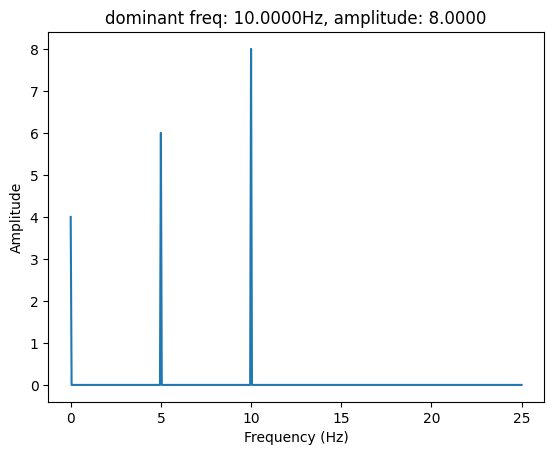

In [18]:
mags = (2 / len(y)) * scipy.fft.rfft(y) # perform fft on real signal, 2/n needed to scale amplitudes appropriately
mags[0] /= 2 # DC component needs to be halved
period = (x[1] - x[0])  # time period between samples
domain = scipy.fft.rfftfreq(len(y), period) # returns frequency bins
dominant_freq = domain[np.argmax(np.abs(mags))] # getting dominant frequency


plt.plot(domain, np.abs(mags)); # frequency domain plot
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.title(f'dominant freq: {dominant_freq:.4f}Hz, amplitude: {np.max(np.abs(mags)):.4f}')

As expected, we get two peaks at 5Hz and 10Hz, respectively, and the heights of the peaks match the amplitudes of the original sine waves. There is also a peak at 0Hz, which corresponds to the DC component of the signal (the vertical shift by 4 units)

## FFT on EEG signal

Since the eeg data is 2D (channels, sequence length), we will do a channelwise FFT

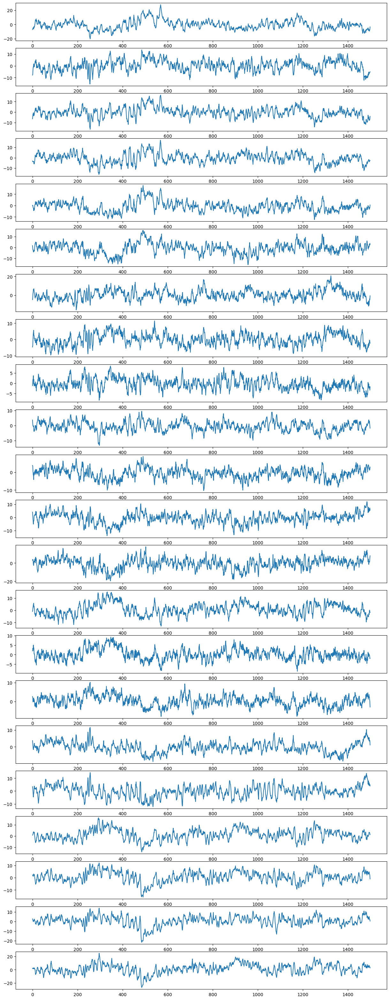

In [10]:
plt.figure(figsize = (15, 40))
for i in range(sig.shape[0]):
  plt.subplot(sig.shape[0], 1, i + 1)
  plt.plot(sig[i])

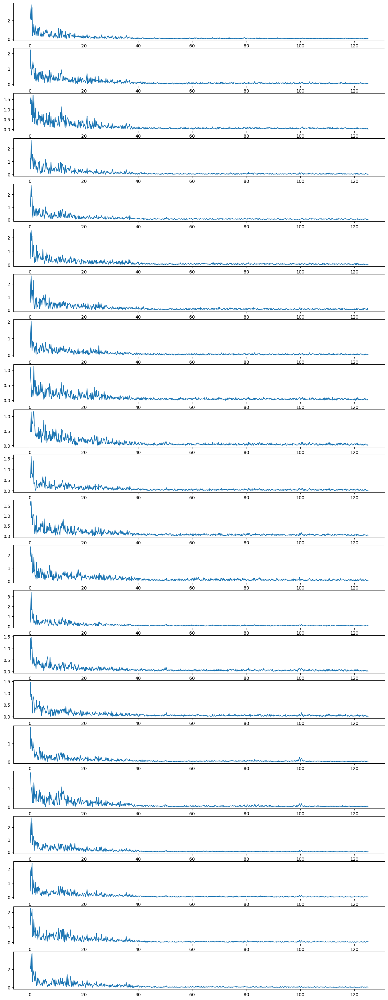

In [11]:
mags = (2 / sig.shape[1]) * np.abs(scipy.fft.rfft(sig, axis=1))
period = 1/250
domain = scipy.fft.rfftfreq(sig.shape[1], period)

plt.figure(figsize = (15, 40))
for i in range(len(mags)):
  plt.subplot(mags.shape[0], 1, i + 1)
  plt.plot(domain[1:], mags[i, 1:]) # excluding DC component

We see that the amplitude declines dramatically as frequency increases. Sometimes, however, there may be  a spike around 60Hz, which is the frequency of power line transmission in the US. We can add a 60Hz sin wave and perform bandpass and notch filtering and then visualize the frequency data again on just the first channel

## EEG signal filtering seen in Frequency Domain

In [25]:
sim_sig = sig[0,:] + np.sin(60 * 2*np.pi * np.arange(0, 6, period))
mags = (2 / (len(sim_sig))) * np.abs(scipy.fft.rfft(sim_sig))
domain = scipy.fft.rfftfreq(len(sim_sig), period)

In [26]:
# bandpass filters attenuate frequencies outside of a band (crit_freq)
order = 4
crit_freq = [5, 40]
sampling_freq = 250

b, a = scipy.signal.butter(order, crit_freq, btype = 'bandpass', fs = sampling_freq)
processed_signal = scipy.signal.filtfilt(b, a, sim_sig)

# notch filter at 60Hz
crit_freq = 60

b, a = scipy.signal.iirnotch(crit_freq, 30, sampling_freq)
processed_signal2 = scipy.signal.filtfilt(b, a, processed_signal)

Text(0.5, 1.0, 'bandpass + notch filtered signal')

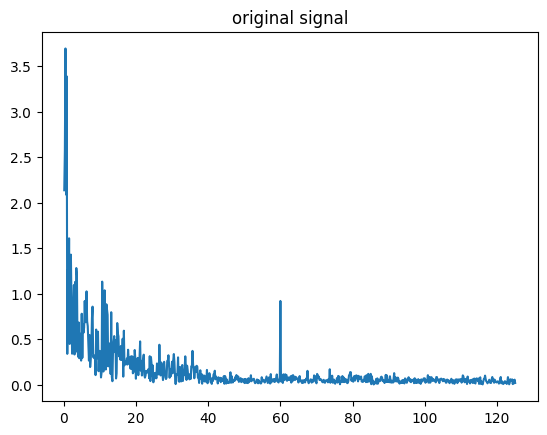

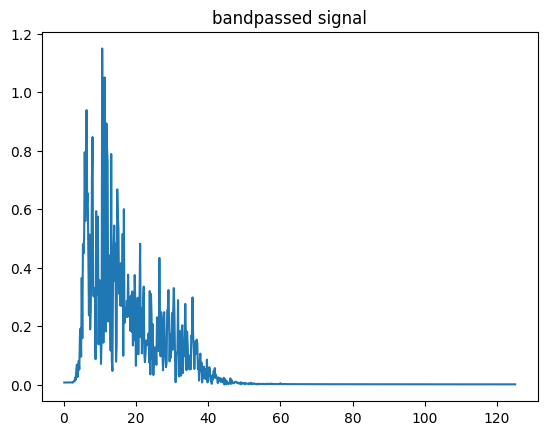

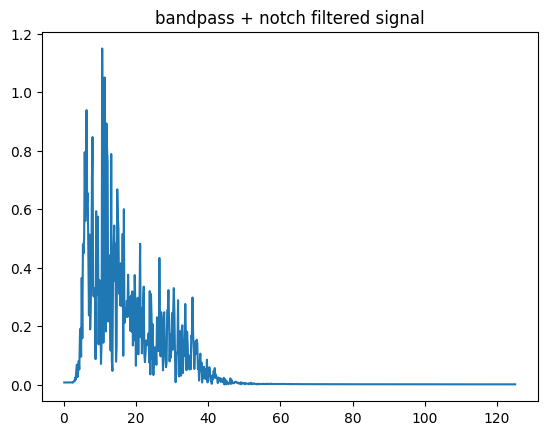

In [27]:
mags2 = (2 / len(sim_sig)) * np.abs(scipy.fft.rfft(processed_signal))
mags3 = (2 / len(sim_sig)) * np.abs(scipy.fft.rfft(processed_signal2))
period = 1/250

plt.figure()
plt.plot(domain[1:], mags[1:])
plt.title('original signal')
plt.figure()
plt.plot(domain[1:], mags2[1:])
plt.title('bandpassed signal')
plt.figure()
plt.plot(domain[1:], mags3[1:])
plt.title('bandpass + notch filtered signal')

The spike at 60Hz vanished and the frequencies present as well as those that have been attenuated are consistent with the pass band of [5, 40]. We can also see that bandpass filtering was powerful enough, and there was no need for the high quality notch filter at 60Hz. This provides a greater appreciation of the importance of filtering prior to model training.

# Short Time Fourier Transform

One of the issues with FFT is its inability to provide time localized information. We can see all the frequencies present when the eeg channel is viewed in the aggregate, but where in time are these frequencies occuring?

Short Time Fourier Transform is an approach that captures time-frequency information by using a window sliding technique over the signal and performing FFT on each time slice

Advantages of Short Time Fourier Transform (STFT)
* provides time-frequency information
* captures finer/more localized frequency information
* better equipped to handle non-stationary signals (frequencies change over time)

Disadvantages of STFT
* greater computational cost
* smaller window provides lower frequency resolution
  * Tradeoff between time and frequency resolution


Analogy: If you were to listen to a song, FFT would only tell you the pitches/notes present in the whole song, but STFT would tell you when in the song each note occurs.

Scipy module: https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.ShortTimeFFT.html#scipy.signal.ShortTimeFFT

## STFT on synthetic signal

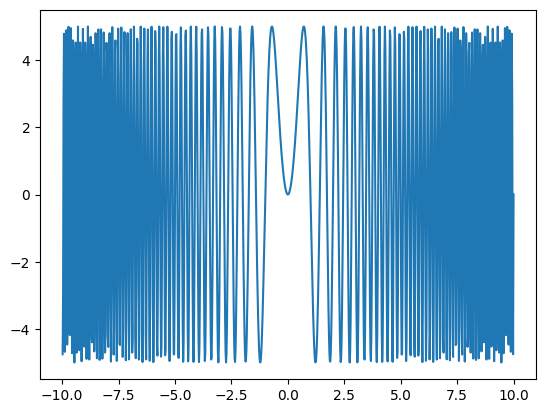

In [42]:
x = np.linspace(-10, 10, 1001)[1:] # interval (-10, 10] with 1000 datapoints
y = 5 * np.sin(np.pi * x**2) # sin with changing frequency
plt.plot(x, y);

In [43]:
gauss_window = scipy.signal.windows.gaussian(50, std=8, sym = False)
fs = 1 / (x[1] - x[0])
STFT = scipy.signal.ShortTimeFFT(gauss_window, 10, fs, scale_to='magnitude')
amplitudes = STFT.stft(y)

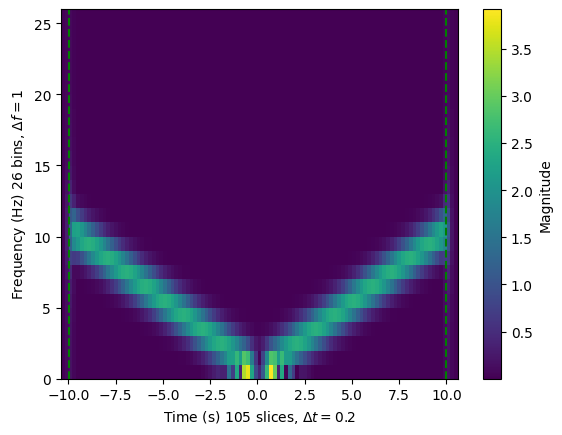

In [44]:
bounds = list(STFT.extent(len(y)))
bounds[0] -= 10
bounds[1] -= 10
fig, ax = plt.subplots()
ax.set(xlim= bounds[:2])
img = ax.imshow(np.abs(amplitudes), aspect = 'auto', origin = 'lower', extent = bounds)
plt.xlabel(f'Time (s) {STFT.p_num(len(y))} slices, $\Delta t = {STFT.delta_t:.1f}\,$')
plt.ylabel(f'Frequency (Hz) {STFT.f_pts} bins, $\Delta f = {STFT.delta_f:g}\,$')
ax.axvline(x[0], color = 'g', linestyle='--') # vertical bars show range of data that should be considered
ax.axvline(x[-1], color = 'g', linestyle='--')
#ax.plot(x, abs(x/1.8), 'b--')
fig.colorbar(img, label = "Magnitude")

Here we are clearly able to see the time on the x-axis and frequency on the y axis. The color/heat of the plot indicates the amplitude of the frequency, which matches the original function. The crucial piece of information that STFT shows us is how frequency changes with time. We can see that frequency increases as we move away from 0 just like in the function plot in a previous cell. We wouldn't recover this information from a regular FFT.

## STFT on EEG signal

In [45]:
gauss_window = scipy.signal.windows.gaussian(100, std=8, sym = False)
fs = 250
STFT = scipy.signal.ShortTimeFFT(gauss_window, 10, fs, scale_to='magnitude')
amplitudes = STFT.stft(sig, axis=1)

Text(0.02, 0.5, 'Frequency (Hz) 51 bins, $\\Delta f = 2.5\\,$')

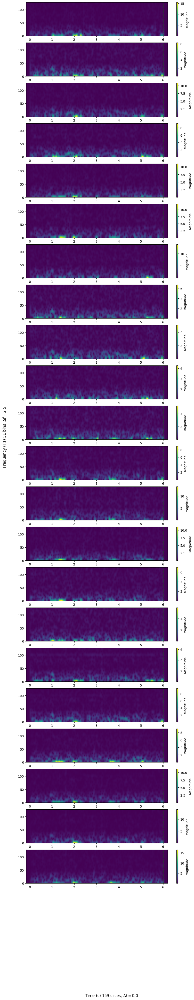

In [46]:
# plotting pcolormesh for each channel in signal
bounds = STFT.extent(sig.shape[1])
fig = plt.figure(figsize = (10, 50))
for i in range(sig.shape[0]):
  ax = plt.subplot(sig.shape[0], 1, i + 1)
  plt.imshow(np.abs(amplitudes[i]), aspect = 'auto', origin = 'lower', extent = bounds)
  ax.axvline(0, color = 'g', linestyle='--')
  ax.axvline(sig.shape[1] / 250, color = 'g', linestyle='--')
  plt.colorbar(label = 'Magnitude')
fig.supxlabel(f'Time (s) {STFT.p_num(sig.shape[1])} slices, $\Delta t = {STFT.delta_t:.1f}\,$')
fig.supylabel(f'Frequency (Hz) {STFT.f_pts} bins, $\Delta f = {STFT.delta_f:g}\,$')

Lower frequencies have higher magnitude, which is consistent with fft plots

# Wavelet Transform

**Wavelet vs sin**
- Sine and cosine are waves that oscillate infinitely over their domain at a particular frequency. The range of these functions is bounded but the functions never converge to a particular value as time goes to infinity.
- Wavelets as the name suggests are like mini waves. They are locally oscillatory, meaning that for most of their domain they are zero. There is only a small time period where there is some oscillation.

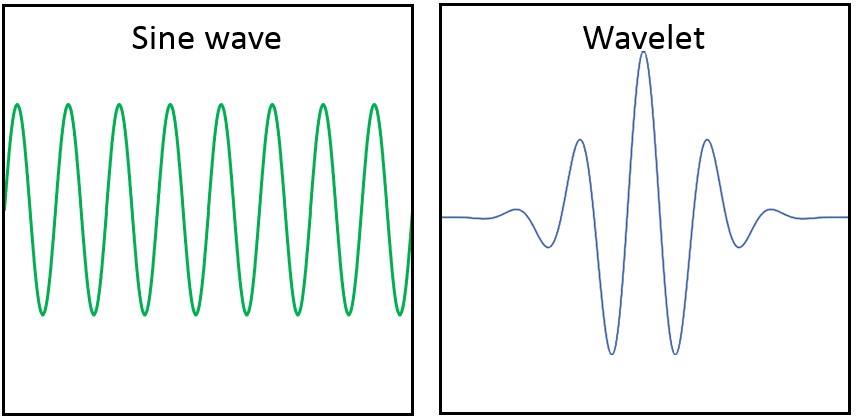

**FFT vs Wavelet Transform**
- FFT decomposes a signal into a sum of sin and cosine components with different frequencies and amplitudes
  - disadvantage is lack of time localized information
- Wavelet transforms use wavelets to get localized oscillatory information about a function. They do this using a sliding and scaling parameter (b and a, respectively, in the image below). The b parameter shifts the wavelet over and captures time localization information, whereas the a parameter changes the spread of the wavelet, allowing for frequency information to be captured. Larger spread/scale wavelets are better able to capture lower frequencies in the signal.  
  - captures time-frequency information
  - commonly used in analysis on biomedical signals

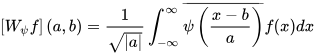

An example that could help illustrate the usefulness of wavelets in biomedical signal analysis is to think of EKG data. EKG data of the heart shows periodic pulses in electrical activity with little activity between heart beats. This behavior is modeled well by wavelets with their localized oscillations.

Pywavelets package: https://pywavelets.readthedocs.io/en/latest/ref/index.html


In [28]:
!pip install PyWavelets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 51.3 MB/s eta 0:00:00


In [29]:
import pywt
pywt.wavelist(kind='continuous') # list of wavelets

['cgau1',
 'cgau2',
 'cgau3',
 'cgau4',
 'cgau5',
 'cgau6',
 'cgau7',
 'cgau8',
 'cmor',
 'fbsp',
 'gaus1',
 'gaus2',
 'gaus3',
 'gaus4',
 'gaus5',
 'gaus6',
 'gaus7',
 'gaus8',
 'mexh',
 'morl',
 'shan']

## CWT on synthetic signal

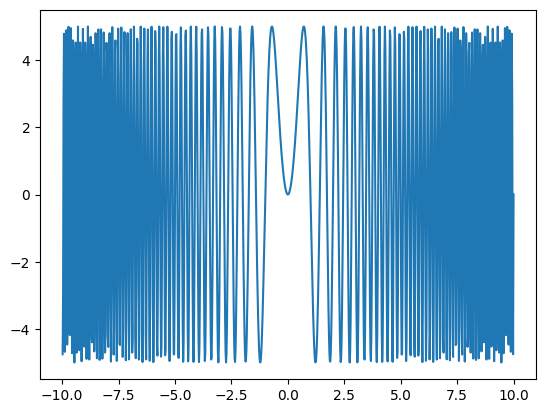

In [34]:
x = np.linspace(-10, 10, 1001)[1:] # interval (-10, 10] with 1000 datapoints
y = 5 * np.sin(np.pi * x**2) # sin with changing frequency
plt.plot(x, y);

In [31]:
scales = np.arange(1, 51, 0.1) # scales for wavelet transform
period = x[1] - x[0] # sampling period
coef, freqs = pywt.cwt(y, scales, 'morl', period) # continuous wavelet transform with morlet wavelet
coef.shape

(500, 1000)

In [32]:
pywt.scale2frequency('morl', scales)/period # code to convert scales to frequencies

array([40.625     , 36.93181818, 33.85416667, 31.25      , 29.01785714,
       27.08333333, 25.390625  , 23.89705882, 22.56944444, 21.38157895,
       20.3125    , 19.3452381 , 18.46590909, 17.66304348, 16.92708333,
       16.25      , 15.625     , 15.0462963 , 14.50892857, 14.00862069,
       13.54166667, 13.10483871, 12.6953125 , 12.31060606, 11.94852941,
       11.60714286, 11.28472222, 10.97972973, 10.69078947, 10.41666667,
       10.15625   ,  9.90853659,  9.67261905,  9.44767442,  9.23295455,
        9.02777778,  8.83152174,  8.64361702,  8.46354167,  8.29081633,
        8.125     ,  7.96568627,  7.8125    ,  7.66509434,  7.52314815,
        7.38636364,  7.25446429,  7.12719298,  7.00431034,  6.88559322,
        6.77083333,  6.65983607,  6.55241935,  6.4484127 ,  6.34765625,
        6.25      ,  6.15530303,  6.06343284,  5.97426471,  5.88768116,
        5.80357143,  5.72183099,  5.64236111,  5.56506849,  5.48986486,
        5.41666667,  5.34539474,  5.27597403,  5.20833333,  5.14

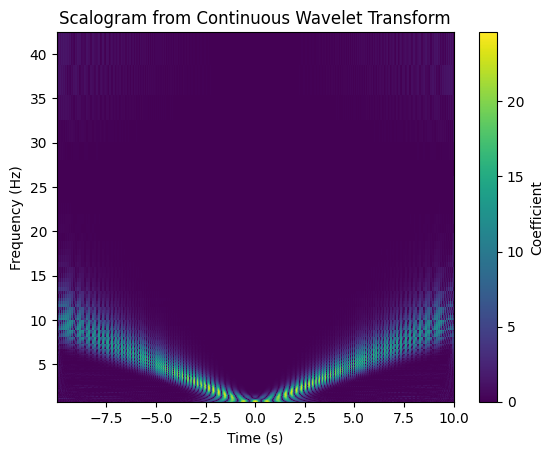

In [33]:
plt.pcolormesh(x, freqs, abs(coef));
plt.colorbar(label = 'Coefficient')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.title('Scalogram from Continuous Wavelet Transform');

We see the same pattern as in the plot from STFT. Frequency increases as we move away from the origin.

## CWT on EEG signal

In [56]:
scales = np.geomspace(1, 100, 500) # scales are log spaced, which is better according to docs
coef, freqs = pywt.cwt(sig, scales, 'morl', 1/250)
coef.shape

(500, 22, 1500)

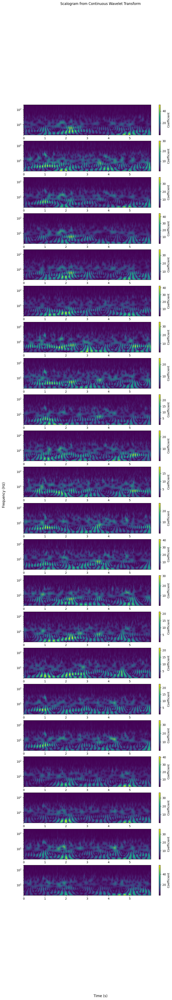

In [58]:
# plotting scalogram for each channel in signal
fig = plt.figure(figsize = (10, 50))
for i in range(sig.shape[0]):
  ax = plt.subplot(sig.shape[0], 1, i + 1)
  ax.set_yscale('log')
  plt.pcolormesh(np.arange(stop = sig.shape[1] * (1/250), step = 1/250), freqs, abs(coef[:,i,:]));
  plt.colorbar(label = 'Coefficient')
fig.supxlabel(f'Time (s)')
fig.supylabel(f'Frequency (Hz)')
fig.suptitle('Scalogram from Continuous Wavelet Transform');

The signal still seems to have higher scalogram coefficients for lower frequencies, but there is a lot of noise.

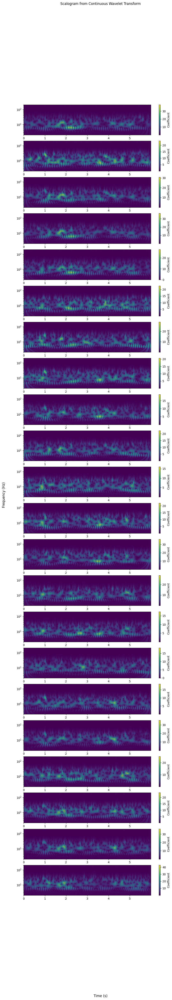

In [59]:
order = 4
crit_freq = [5, 40]
sampling_freq = 250

b, a = scipy.signal.butter(order, crit_freq, btype = 'bandpass', fs = sampling_freq)
processed_signal = scipy.signal.filtfilt(b, a, sig, 1)

scales = np.geomspace(1, 100, 500)
coef, freqs = pywt.cwt(processed_signal, scales, 'morl', 1/250)

fig = plt.figure(figsize = (10, 50))
for i in range(sig.shape[0]):
  ax = plt.subplot(sig.shape[0], 1, i + 1)
  ax.set_yscale('log')
  plt.pcolormesh(np.arange(stop = sig.shape[1] * (1/250), step = 1/250), freqs, abs(coef[:,i,:]));
  plt.colorbar(label = 'Coefficient')
fig.supxlabel(f'Time (s)')
fig.supylabel(f'Frequency (Hz)')
fig.suptitle('Scalogram from Continuous Wavelet Transform');

After bandpass filtering, the plots look better. The highest coefficients are for frequencies within the pass band, but the plots aren't as nice as the STFT plots. This demonstrates the need to try multiple different signal processing methods to decide which works best in each situation.

**Wavelet Scattering as an alternative to Convolutional Layers**

This section provides a basic understanding of the use of wavelet transforms, but there are more sophisticated applications of wavelets. Here is a cool video from MATLAB's youtube channel on wavelet scattering and its use in feature extraction for deep learning tasks: https://www.youtube.com/watch?v=XyeZFo1d5aY

# Hilbert-Huang Transform

This is another approach to extracting time-frequency information from highly non-linear, non-stationary signals. There are two steps to HHT.
1. Empirical Mode Decomposition (https://pyemd.readthedocs.io/en/latest/intro.html)
- decomposes a signal into multiple oscillatory components known as Intrinsic Mode Functions (IMFs)
- IMFs are produced by interpolating the local minima and maximima of a signal, producing a lower and upper envelope. The mean of these two envelopes is calculated and subtracted from the current signal, producing an IMF. This process is repeated iteratively until a stopping criteria is reached (like approximately equal number of extrema and roots or minimal difference between subsequent sifts for IMFs).
- IMFs sum to reconstruct original signal
2. Hilbert Transform (https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.hilbert.html)
- provides instantaneous frequency information about signal, where f<sub>inst</sub> = (1/2$\pi$) * d$\Phi$ / dt where $\Phi$ is phase angle

In [3]:
!pip install EMD-signal

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.1/82.1 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.4/119.4 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 144.3/144.3 kB 9.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.8/56.8 kB 3.5 MB/s eta 0:00:00


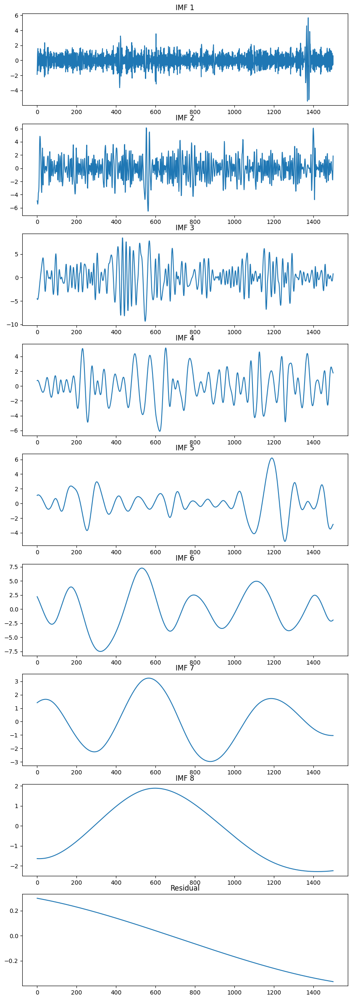

In [8]:
## performing emd on first channel for simplicity
from PyEMD import EMD
emd = EMD()

imfs = emd(sig[0])

plt.figure(figsize = (10, 30))
for i in range(len(imfs)):
  plt.subplot(len(imfs), 1, i + 1)
  plt.plot(imfs[i])
  if i != len(imfs) - 1:
    plt.title(f'IMF {i + 1}')
  else:
    plt.title('Residual')

Text(0.5, 1.0, 'Reconstructed Channel')

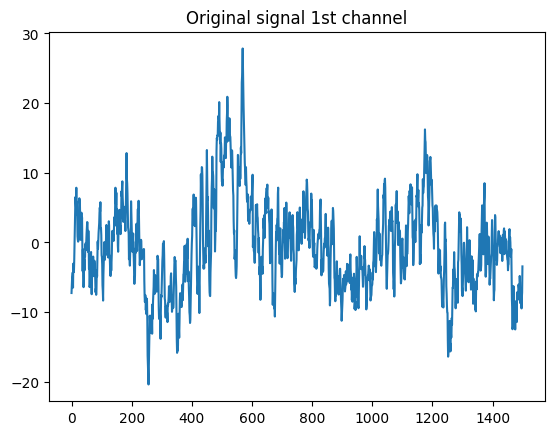

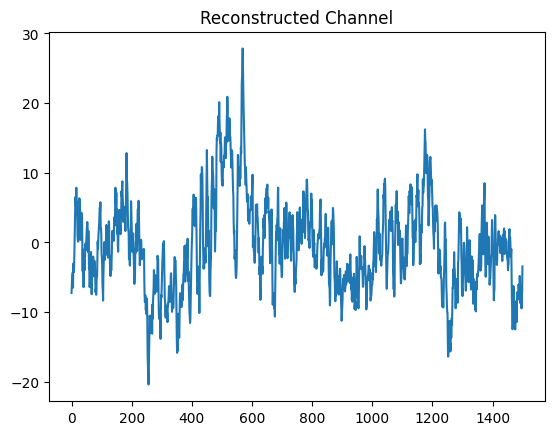

In [9]:
# original first channel vs reconstructed first channel
plt.figure()
plt.plot(sig[0])
plt.title('Original signal 1st channel')

plt.figure()
plt.plot(np.sum(imfs, 0))
plt.title('Reconstructed Channel')

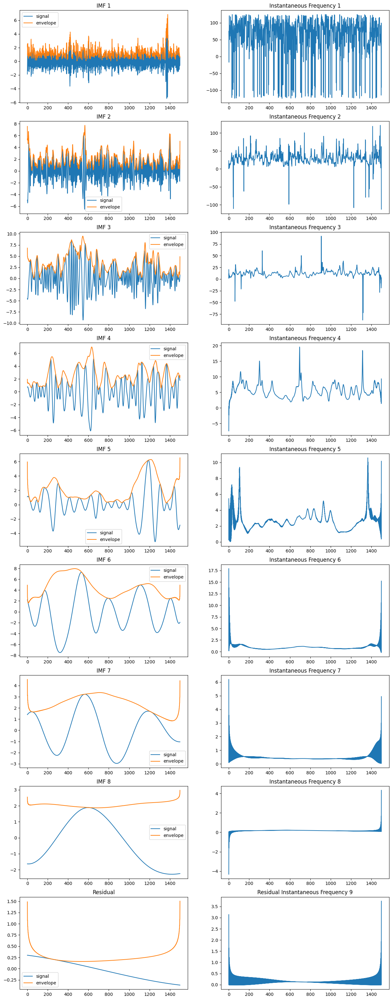

In [10]:
# perform hilbert transform on each IMF to get instantaneous frequency
fs = 250 # sampling frequency in hertz
analytic_sigs = [scipy.signal.hilbert(imf) for imf in imfs] # performing hilbert transform on each imf
amplitude = [np.abs(signal) for signal in analytic_sigs] # amplitude of complex signal
normalized_phase = [np.unwrap(np.angle(signal)) for signal in analytic_sigs] # phase angle with max discontinuity of pi btw numbers
f_inst = [np.diff(phi) / (2*np.pi*(1/fs)) for phi in normalized_phase] # approximate instanteous frequency with finite differences

plt.figure(figsize = (15, 40))
for i in range(len(f_inst)):
  if i != len(f_inst) - 1:
    plt.subplot(len(f_inst), 2, 2*i + 1)
    plt.plot(imfs[i], label = 'signal')
    plt.plot(amplitude[i], label = 'envelope')
    plt.legend()
    plt.title(f'IMF {i + 1}')

    plt.subplot(len(f_inst), 2, 2*i + 2)
    plt.plot(f_inst[i])
    plt.title(f'Instantaneous Frequency {i + 1}')
  else:
    plt.subplot(len(f_inst), 2, 2*i + 1)
    plt.plot(imfs[i], label = 'signal')
    plt.plot(amplitude[i], label = 'envelope')
    plt.legend()
    plt.title(f'Residual')

    plt.subplot(len(f_inst), 2, 2*i + 2)
    plt.plot(f_inst[i])
    plt.title(f'Residual Instantaneous Frequency {i + 1}')

# Citations
BCI Competition IV 2a link
https://www.bbci.de/competition/iv/

FFT vs DFT equation
https://www.google.com/url?sa=i&url=https%3A%2F%2Fdsp.stackexchange.com%2Fquestions%2F66113%2Fdiscrete-and-continuous-signals&psig=AOvVaw0wY7RqI6_-xphq4QDEEAqf&ust=1739240181142000&source=images&cd=vfe&opi=89978449&ved=0CBQQjRxqFwoTCPjciIeFuIsDFQAAAAAdAAAAABAE

FFT image
https://www.google.com/imgres?q=fourier%20transform%20image&imgurl=https%3A%2F%2Fmriquestions.com%2Fuploads%2F3%2F4%2F5%2F7%2F34572113%2F3311485_orig.gif&imgrefurl=https%3A%2F%2Fmriquestions.com%2Ffourier-transform-ft.html&docid=ADhefdEmBByKfM&tbnid=Dzphex-HpgfWwM&vet=12ahUKEwiN3bavhbiLAxUs78kDHfFhF2cQM3oECF4QAA..i&w=900&h=522&hcb=2&ved=2ahUKEwiN3bavhbiLAxUs78kDHfFhF2cQM3oECF4QAA

sin vs wavelet image
https://community.sw.siemens.com/servlet/rtaImage?eid=ka64O0000004RJQ&feoid=00N4O000006Yxpf&refid=0EM4O0000011464

Wavelet equation
https://en.wikipedia.org/wiki/Wavelet_transform